In [2]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Set the paths to your image folders
train_dir = 'D:/potatoo/images/Kriisan/train'
validation_dir = 'D:/potatoo/images/Kriisan/validation'
test_dir = 'D:/potatoo/images/Kriisan/test'

# Set the parameters for the data generators
batch_size = 32
img_height, img_width = 256, 256

# Create data generators for training and validation
train_datagen = ImageDataGenerator(rescale=1.0/255.0)
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical'
)

validation_datagen = ImageDataGenerator(rescale=1.0/255.0)
validation_generator = validation_datagen.flow_from_directory(
    validation_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical'
)

# Create a deeper CNN model
model = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(32, 3, activation='relu', input_shape=(img_height, img_width, 3)),
    tf.keras.layers.MaxPooling2D(),
    tf.keras.layers.Conv2D(64, 3, activation='relu'),
    tf.keras.layers.MaxPooling2D(),
    tf.keras.layers.Conv2D(128, 3, activation='relu'),
    tf.keras.layers.MaxPooling2D(),
    tf.keras.layers.Conv2D(256, 3, activation='relu'),
    tf.keras.layers.MaxPooling2D(),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(256, activation='relu'),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(train_generator.num_classes, activation='softmax')
])

# Compile the model
model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Train the model
epochs = 30
history = model.fit(
    train_generator,
    epochs=epochs,
    validation_data=validation_generator
)

# Display the training and validation loss
print("Training Loss:", history.history['loss'])
print("Validation Loss:", history.history['val_loss'])

# Display the training and validation accuracy
print("Training Accuracy:", history.history['accuracy'])
print("Validation Accuracy:", history.history['val_accuracy'])


Found 26171 images belonging to 3 classes.
Found 26171 images belonging to 3 classes.
Epoch 1/30
818/818 [==============================] - 2554s 3s/step - loss: 0.7085 - accuracy: 0.6887 - val_loss: 0.3233 - val_accuracy: 0.8870
Epoch 2/30
818/818 [==============================] - 2007s 2s/step - loss: 0.3188 - accuracy: 0.8903 - val_loss: 0.1671 - val_accuracy: 0.9428
Epoch 3/30
818/818 [==============================] - 1918s 2s/step - loss: 0.1850 - accuracy: 0.9403 - val_loss: 0.1371 - val_accuracy: 0.9538
Epoch 4/30
818/818 [==============================] - 1911s 2s/step - loss: 0.1324 - accuracy: 0.9584 - val_loss: 0.0623 - val_accuracy: 0.9808
Epoch 5/30
818/818 [==============================] - 1916s 2s/step - loss: 0.1088 - accuracy: 0.9661 - val_loss: 0.0495 - val_accuracy: 0.9851
Epoch 6/30
818/818 [==============================] - 2194s 3s/step - loss: 0.0915 - accuracy: 0.9712 - val_loss: 0.0373 - val_accuracy: 0.9882
Epoch 7/30
818/818 [==============================

In [3]:
# Print the training and validation loss
train_loss = history.history['loss']
val_loss = history.history['val_loss']
print("Training Loss:", train_loss)
print("Validation Loss:", val_loss)

# Print the training and validation accuracy
train_acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
print("Training Accuracy:", train_acc)
print("Validation Accuracy:", val_acc)

Training Loss: [0.7084684371948242, 0.3187751770019531, 0.1850215047597885, 0.1323658972978592, 0.10883405059576035, 0.09149366617202759, 0.08310601860284805, 0.09263209998607635, 0.06534253805875778, 0.052944380789995193, 0.05278455838561058, 0.06187734752893448, 0.0426926389336586, 0.043153248727321625, 0.04981376975774765, 0.04505092278122902, 0.03715202584862709, 0.029835283756256104, 0.026706598699092865, 0.03923333063721657, 0.02617531269788742, 0.028685595840215683, 0.04189113527536392, 0.027375051751732826, 0.03711264580488205, 0.02081149071455002, 0.03796754404902458, 0.02000478468835354, 0.04193570092320442, 0.01747126318514347]
Validation Loss: [0.3233148157596588, 0.16711807250976562, 0.137113556265831, 0.06234343349933624, 0.04951772466301918, 0.037251777946949005, 0.03620433434844017, 0.05957360565662384, 0.029936838895082474, 0.04285264387726784, 0.034308914095163345, 0.03737989813089371, 0.03396683186292648, 0.1945757269859314, 0.0116088492795825, 0.0142676318064332, 0.

In [4]:
# Print the final training and validation loss
train_loss = history.history['loss'][-1]
val_loss = history.history['val_loss'][-1]
print("Training Loss:", train_loss)
print("Validation Loss:", val_loss)

# Print the final training and validation accuracy
train_acc = history.history['accuracy'][-1]
val_acc = history.history['val_accuracy'][-1]
print("Training Accuracy:", train_acc)
print("Validation Accuracy:", val_acc)

Training Loss: 0.01747126318514347
Validation Loss: 0.0017609827918931842
Training Accuracy: 0.9948798418045044
Validation Accuracy: 0.9996943473815918


In [5]:
# Format and print the final training and validation loss
train_loss = "{:.2f}".format(history.history['loss'][-1])
val_loss = "{:.2f}".format(history.history['val_loss'][-1])
print("Training Loss:", train_loss)
print("Validation Loss:", val_loss)

# Format and print the final training and validation accuracy
train_acc = "{:.2f}".format(history.history['accuracy'][-1])
val_acc = "{:.2f}".format(history.history['val_accuracy'][-1])
print("Training Accuracy:", train_acc)
print("Validation Accuracy:", val_acc)

Training Loss: 0.02
Validation Loss: 0.00
Training Accuracy: 0.99
Validation Accuracy: 1.00


In [6]:
# Print the final training and validation loss
train_loss = history.history['loss'][-1]
val_loss = history.history['val_loss'][-1]
print("Training Loss: {:.2f}".format(train_loss * 100))
print("Validation Loss: {:.2f}".format(val_loss * 100))

# Print the final training and validation accuracy
train_acc = history.history['accuracy'][-1]
val_acc = history.history['val_accuracy'][-1]
print("Training Accuracy: {:.2f}".format(train_acc * 100))
print("Validation Accuracy: {:.2f}".format(val_acc * 100))

Training Loss: 1.75
Validation Loss: 0.18
Training Accuracy: 99.49
Validation Accuracy: 99.97


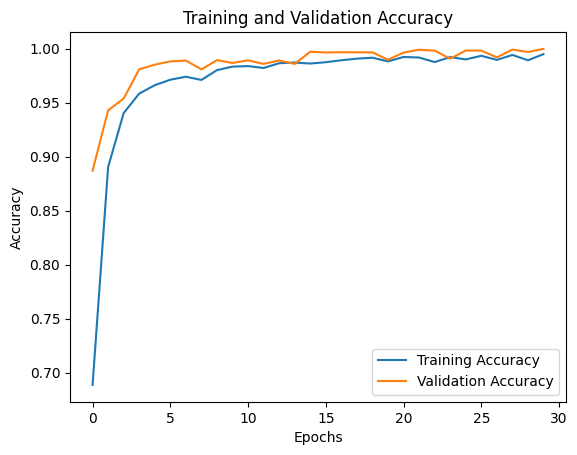

In [7]:
import matplotlib.pyplot as plt

# Plot the training and validation accuracy
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()


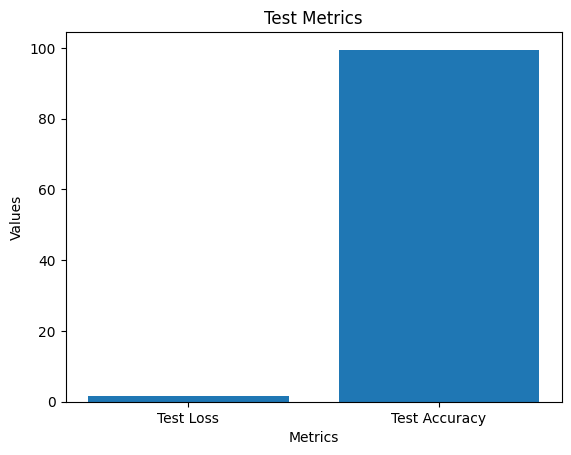

In [8]:
import matplotlib.pyplot as plt

# Define the test loss and accuracy values
test_loss = 1.75
test_accuracy = 99.49

# Create a list of labels for the x-axis
labels = ['Test Loss', 'Test Accuracy']

# Create a list of values for the y-axis
values = [test_loss, test_accuracy]

# Plotting the bar chart
plt.bar(labels, values)

# Setting the title and axis labels
plt.title('Test Metrics')
plt.xlabel('Metrics')
plt.ylabel('Values')

# Displaying the plot
plt.show()


In [9]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_4 (Conv2D)           (None, 254, 254, 32)      896       
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 127, 127, 32)     0         
 2D)                                                             
                                                                 
 conv2d_5 (Conv2D)           (None, 125, 125, 64)      18496     
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 62, 62, 64)       0         
 2D)                                                             
                                                                 
 conv2d_6 (Conv2D)           (None, 60, 60, 128)       73856     
                                                                 
 max_pooling2d_6 (MaxPooling  (None, 30, 30, 128)     

In [10]:
import numpy as np
from tensorflow.keras.preprocessing.image import load_img, img_to_array

# Set the path to the image you want to predict
image_path = 'D:/potatoo/images/Kriisan/test/Potato___Early_blight/a.jpg'

# Load and preprocess the image
image = load_img(image_path, target_size=(img_height, img_width))
image = img_to_array(image) / 255.0
image = np.expand_dims(image, axis=0)

# Make the prediction
predictions = model.predict(image)

# Get the predicted class label and corresponding probability
predicted_label = np.argmax(predictions[0])
probability = predictions[0][predicted_label]

# Define a dictionary to map class indices to class labels
class_labels = train_generator.class_indices
class_labels = {v: k for k, v in class_labels.items()}

# Print the predicted class and probability
predicted_class = class_labels[predicted_label]
print("Predicted Class:", predicted_class)
print("Probability:", probability)


1/1 [==============================] - 0s 223ms/step
Predicted Class: Potato___Early_Blight
Probability: 0.9999827


1/1 [==============================] - 0s 45ms/step


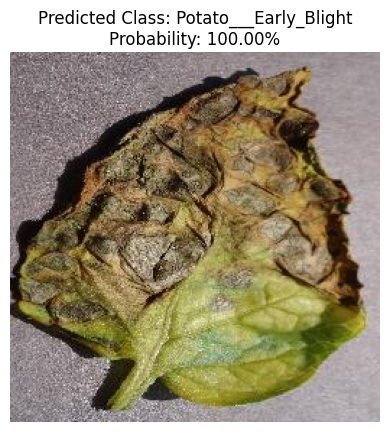

In [11]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import load_img, img_to_array

# Set the path to the image you want to predict
image_path = 'D:/potatoo/images/Kriisan/test/Potato___Early_blight/a.jpg'

# Load and preprocess the image
image = load_img(image_path, target_size=(img_height, img_width))
image_array = img_to_array(image) / 255.0
image = np.expand_dims(image_array, axis=0)

# Make the prediction
predictions = model.predict(image)

# Get the predicted class label and corresponding probability
predicted_label = np.argmax(predictions[0])
probability = predictions[0][predicted_label]

# Define a dictionary to map class indices to class labels
class_labels = train_generator.class_indices
class_labels = {v: k for k, v in class_labels.items()}

# Get the predicted class and probability as text
predicted_class = class_labels[predicted_label]
probability_text = "{:.2f}%".format(probability * 100)

# Display the image with the predicted class and probability
plt.imshow(image_array)
plt.axis('off')
plt.title('Predicted Class: {}\nProbability: {}'.format(predicted_class, probability_text))
plt.show()


1/1 [==============================] - 0s 50ms/step


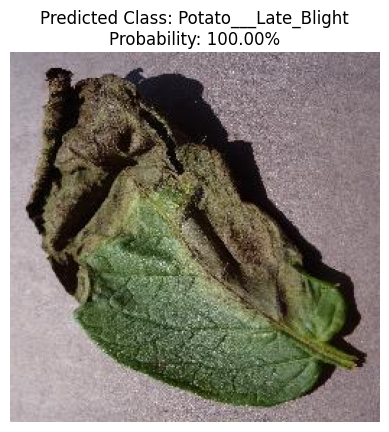

In [12]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import load_img, img_to_array

# Set the path to the image you want to predict
image_path = 'D:/potatoo/images/Kriisan/test/Potato___Late_blight/a.JPG'

# Load and preprocess the image
image = load_img(image_path, target_size=(img_height, img_width))
image_array = img_to_array(image) / 255.0
image = np.expand_dims(image_array, axis=0)

# Make the prediction
predictions = model.predict(image)

# Get the predicted class label and corresponding probability
predicted_label = np.argmax(predictions[0])
probability = predictions[0][predicted_label]

# Define a dictionary to map class indices to class labels
class_labels = train_generator.class_indices
class_labels = {v: k for k, v in class_labels.items()}

# Get the predicted class and probability as text
predicted_class = class_labels[predicted_label]
probability_text = "{:.2f}%".format(probability * 100)

# Display the image with the predicted class and probability
plt.imshow(image_array)
plt.axis('off')
plt.title('Predicted Class: {}\nProbability: {}'.format(predicted_class, probability_text))
plt.show()


1/1 [==============================] - 0s 48ms/step


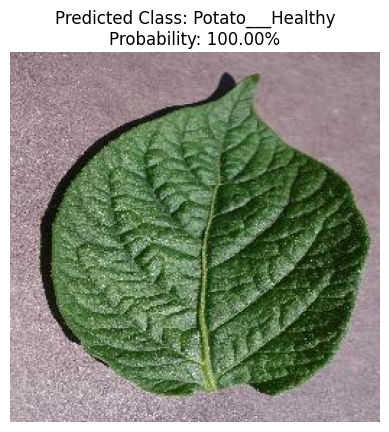

In [13]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import load_img, img_to_array

# Set the path to the image you want to predict
image_path = 'D:/potatoo/images/Kriisan/test/Potato___healthy/a.jpg'

# Load and preprocess the image
image = load_img(image_path, target_size=(img_height, img_width))
image_array = img_to_array(image) / 255.0
image = np.expand_dims(image_array, axis=0)

# Make the prediction
predictions = model.predict(image)

# Get the predicted class label and corresponding probability
predicted_label = np.argmax(predictions[0])
probability = predictions[0][predicted_label]

# Define a dictionary to map class indices to class labels
class_labels = train_generator.class_indices
class_labels = {v: k for k, v in class_labels.items()}

# Get the predicted class and probability as text
predicted_class = class_labels[predicted_label]
probability_text = "{:.2f}%".format(probability * 100)

# Display the image with the predicted class and probability
plt.imshow(image_array)
plt.axis('off')
plt.title('Predicted Class: {}\nProbability: {}'.format(predicted_class, probability_text))
plt.show()


1/1 [==============================] - 0s 42ms/step


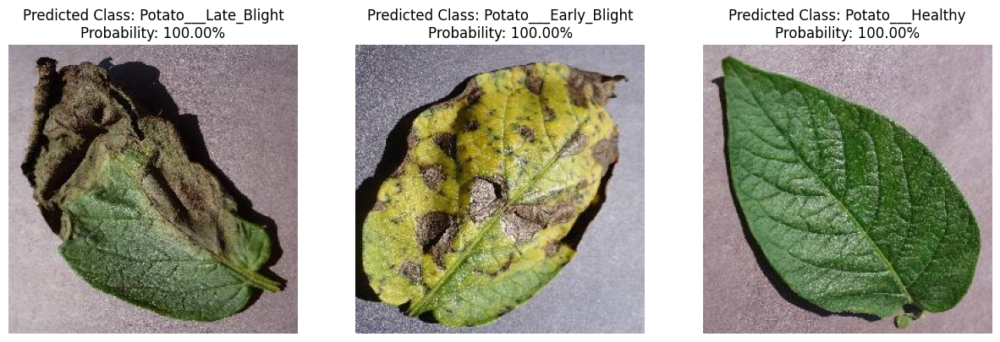

In [14]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import load_img, img_to_array

image_paths = [
     'D:/potatoo/images/Kriisan/test/Potato___Late_blight/a.JPG',
     'D:/potatoo/images/Kriisan/test/Potato___Early_blight/b.jpg',
     'D:/potatoo/images/Kriisan/test/Potato___healthy/b.jpg',
    
    # Add more image paths as needed
]

fig, axs = plt.subplots(1, len(image_paths), figsize=(15, 5))

for i, image_path in enumerate(image_paths):
    # Load and preprocess the image
    image = load_img(image_path, target_size=(img_height, img_width))
    image_array = img_to_array(image) / 255.0
    image = np.expand_dims(image_array, axis=0)

    # Make the prediction
    predictions = model.predict(image)

    # Get the predicted class label and corresponding probability
    predicted_label = np.argmax(predictions[0])
    probability = predictions[0][predicted_label]

    # Define a dictionary to map class indices to class labels
    class_labels = train_generator.class_indices
    class_labels = {v: k for k, v in class_labels.items()}

    # Get the predicted class and probability as text
    predicted_class = class_labels[predicted_label]
    probability_text = "{:.2f}%".format(probability * 100)

    # Display the image with the predicted class and probability
    axs[i].imshow(image_array)
    axs[i].axis('off')
    axs[i].set_title('Predicted Class: {}\nProbability: {}'.format(predicted_class, probability_text))

plt.show()


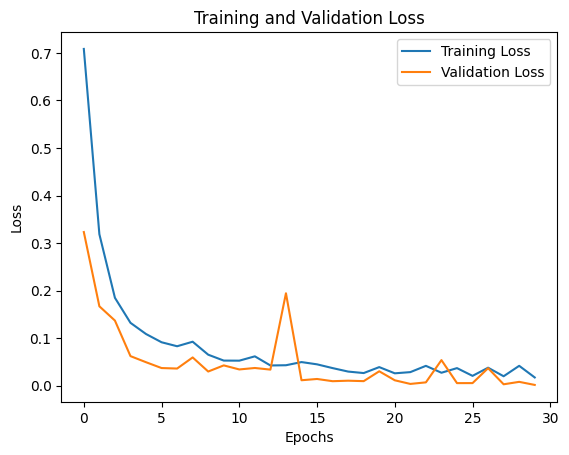

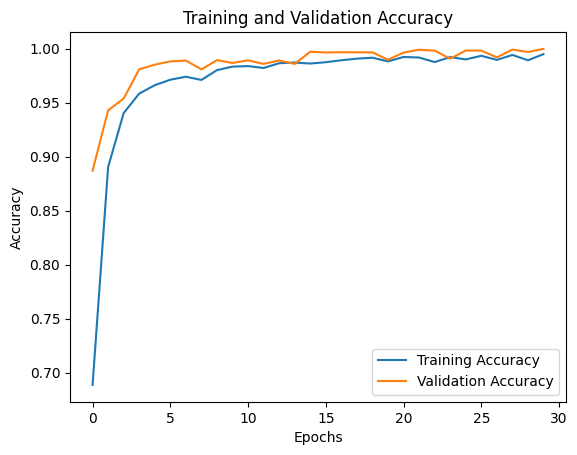

In [15]:
import matplotlib.pyplot as plt

# Get the training and validation loss
training_loss = history.history['loss']
validation_loss = history.history['val_loss']

# Get the training and validation accuracy
training_accuracy = history.history['accuracy']
validation_accuracy = history.history['val_accuracy']

# Plot the training and validation loss
plt.plot(training_loss, label='Training Loss')
plt.plot(validation_loss, label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Plot the training and validation accuracy
plt.plot(training_accuracy, label='Training Accuracy')
plt.plot(validation_accuracy, label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()


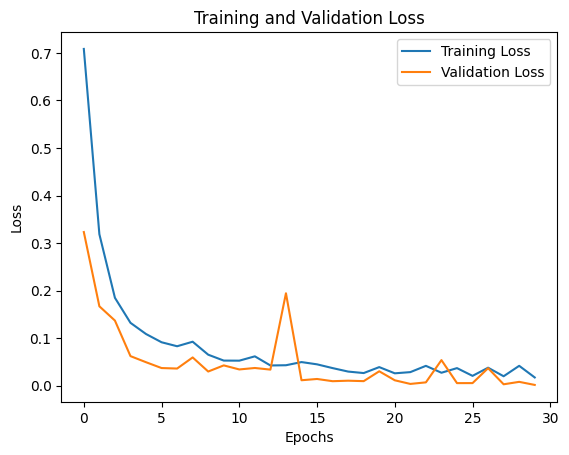

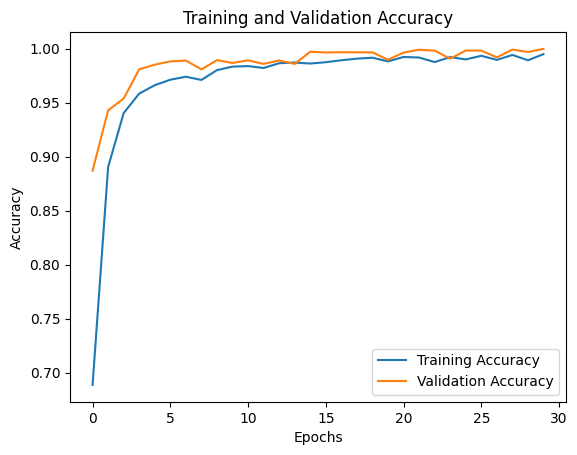

Final Training Loss: 0.01747126318514347
Final Validation Loss: 0.0017609827918931842
Final Training Accuracy: 0.9948798418045044
Final Validation Accuracy: 0.9996943473815918


In [16]:
import matplotlib.pyplot as plt

# Get the training and validation metrics
training_loss = history.history['loss']
validation_loss = history.history['val_loss']
training_accuracy = history.history['accuracy']
validation_accuracy = history.history['val_accuracy']

# Plot the training and validation loss
plt.plot(training_loss, label='Training Loss')
plt.plot(validation_loss, label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Plot the training and validation accuracy
plt.plot(training_accuracy, label='Training Accuracy')
plt.plot(validation_accuracy, label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Print the final metrics
final_training_loss = training_loss[-1]
final_validation_loss = validation_loss[-1]
final_training_accuracy = training_accuracy[-1]
final_validation_accuracy = validation_accuracy[-1]

print("Final Training Loss:", final_training_loss)
print("Final Validation Loss:", final_validation_loss)
print("Final Training Accuracy:", final_training_accuracy)
print("Final Validation Accuracy:", final_validation_accuracy)


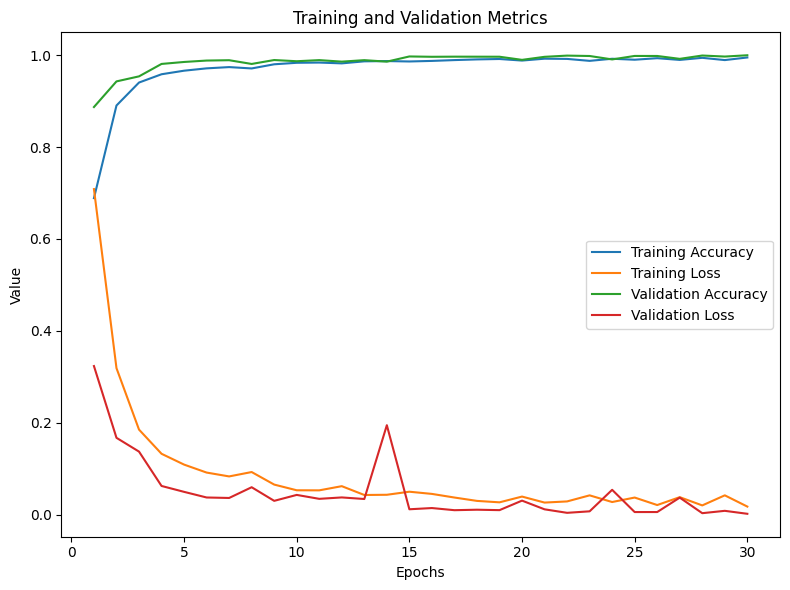

In [17]:
# Assuming you have loaded the training history

# Extract training history
train_acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
train_loss = history.history['loss']
val_loss = history.history['val_loss']

# Plot another figure
plt.figure(figsize=(8, 6))

# Plot training accuracy and loss
plt.plot(range(1, len(train_acc) + 1), train_acc, label='Training Accuracy')
plt.plot(range(1, len(train_loss) + 1), train_loss, label='Training Loss')

# Plot validation accuracy and loss
plt.plot(range(1, len(val_acc) + 1), val_acc, label='Validation Accuracy')
plt.plot(range(1, len(val_loss) + 1), val_loss, label='Validation Loss')

plt.xlabel('Epochs')
plt.ylabel('Value')
plt.title('Training and Validation Metrics')
plt.legend()

plt.tight_layout()
plt.show()


Found 26171 images belonging to 3 classes.
26171/26171 [==============================] - 835s 32ms/step


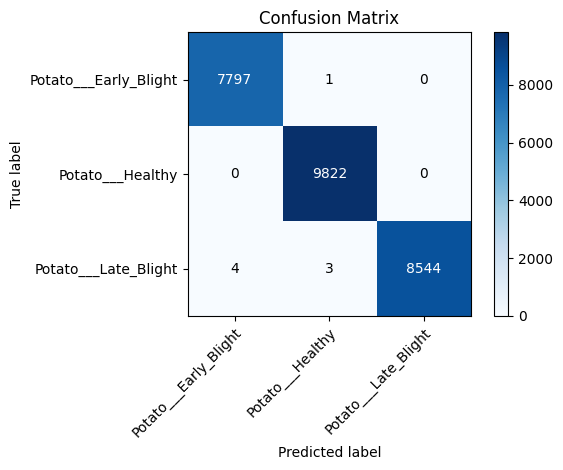

In [18]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
from sklearn.utils.multiclass import unique_labels

# Predict the labels for the test data
test_generator = validation_datagen.flow_from_directory(
    test_dir,
    target_size=(img_height, img_width),
    batch_size=1,
    class_mode='categorical',
    shuffle=False
)

# Make predictions
test_predictions = model.predict(test_generator)
predicted_labels = np.argmax(test_predictions, axis=1)

# Get the true labels
true_labels = test_generator.classes

# Get the unique class labels
classes = list(test_generator.class_indices.keys())

# Compute the confusion matrix
cm = confusion_matrix(true_labels, predicted_labels)

# Create a figure and axes
fig, ax = plt.subplots()
im = ax.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
ax.figure.colorbar(im, ax=ax)

# Add labels to the confusion matrix
ax.set(xticks=np.arange(cm.shape[1]),
       yticks=np.arange(cm.shape[0]),
       xticklabels=classes, yticklabels=classes,
       xlabel='Predicted label', ylabel='True label',
       title='Confusion Matrix')

# Rotate the x-axis labels for better readability
plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
         rotation_mode="anchor")

# Loop over the data and add text annotations
thresh = cm.max() / 2.0
for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        ax.text(j, i, format(cm[i, j], 'd'),
                ha="center", va="center",
                color="white" if cm[i, j] > thresh else "black")

# Show the confusion matrix
plt.tight_layout()
plt.show()


In [19]:
import time

# Predict the labels for the test data and measure execution time
start_time = time.time()
test_generator = validation_datagen.flow_from_directory(
    test_dir,
    target_size=(img_height, img_width),
    batch_size=1,
    class_mode='categorical',
    shuffle=False
)

# Make predictions
test_predictions = model.predict(test_generator)
end_time = time.time()

# Calculate the execution time
execution_time = end_time - start_time

# Print the execution time
print("Evaluation Execution Time: {:.2f} seconds".format(execution_time))


Found 26171 images belonging to 3 classes.
26171/26171 [==============================] - 780s 30ms/step
Evaluation Execution Time: 788.07 seconds


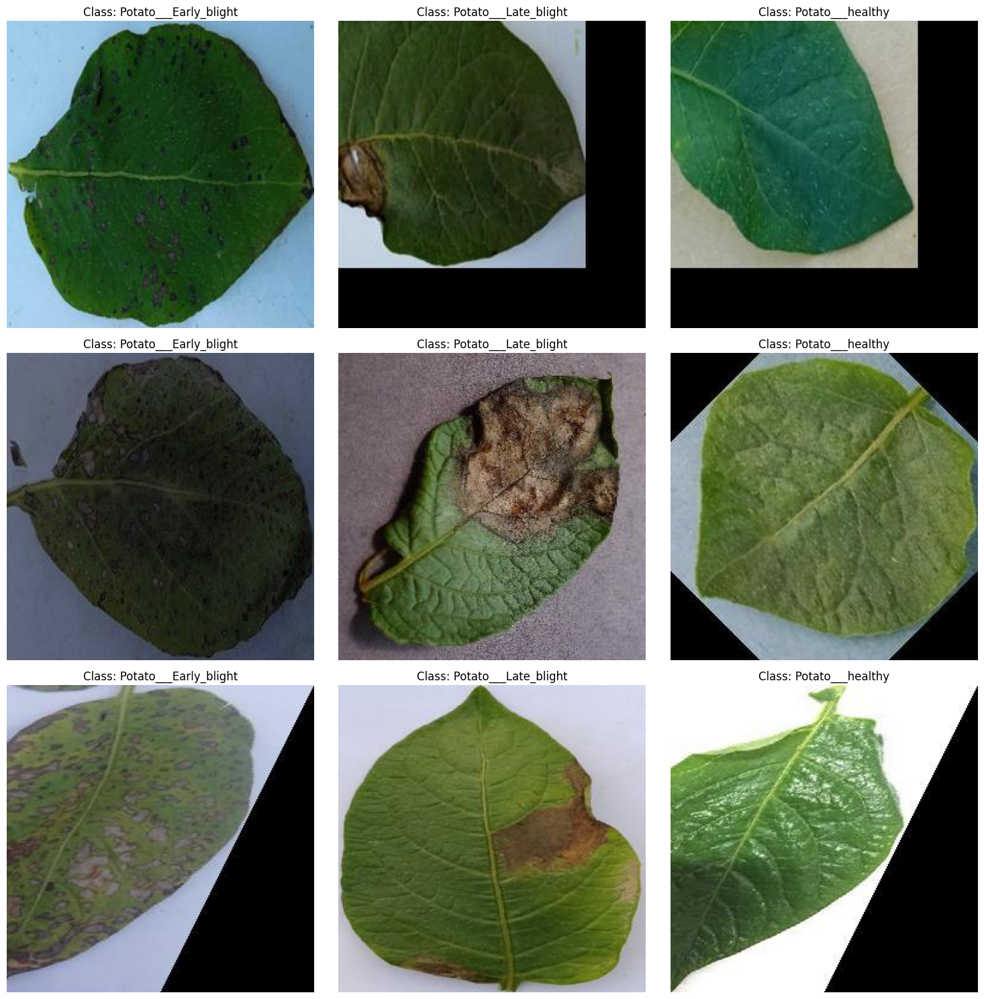

In [20]:
import random
import numpy as np
import matplotlib.pyplot as plt
import os
from tensorflow.keras.preprocessing.image import load_img, img_to_array

# Set the paths to the image folders
image_folder = 'D:/potatoo/images/Kriisan/test'
class_names = ['Potato___Early_blight', 'Potato___Late_blight', 'Potato___healthy']

# Set the number of images to choose per class
num_images_per_class = 3

# Initialize a list to store the randomly chosen images
chosen_images = []

# Randomly choose images from each class
for class_name in class_names:
    class_dir = os.path.join(image_folder, class_name)
    image_paths = os.listdir(class_dir)
    random.shuffle(image_paths)
    chosen_images.extend(image_paths[:num_images_per_class])

# Create subplots to display the chosen images
fig, axs = plt.subplots(num_images_per_class, len(class_names), figsize=(15, 15))

# Load and display the chosen images
for i, image_name in enumerate(chosen_images):
    class_index = i // num_images_per_class
    class_name = class_names[class_index]
    image_path = os.path.join(image_folder, class_name, image_name)
    image = load_img(image_path, target_size=(img_height, img_width))
    image_array = img_to_array(image) / 255.0

    row = i % num_images_per_class
    col = class_index
    ax = axs[row, col]
    ax.imshow(image_array)
    ax.axis('off')
    ax.set_title('Class: {}'.format(class_name))

# Adjust the spacing between subplots
plt.tight_layout()

# Display the plot
plt.show()


1/1 [==============================] - 0s 49ms/step


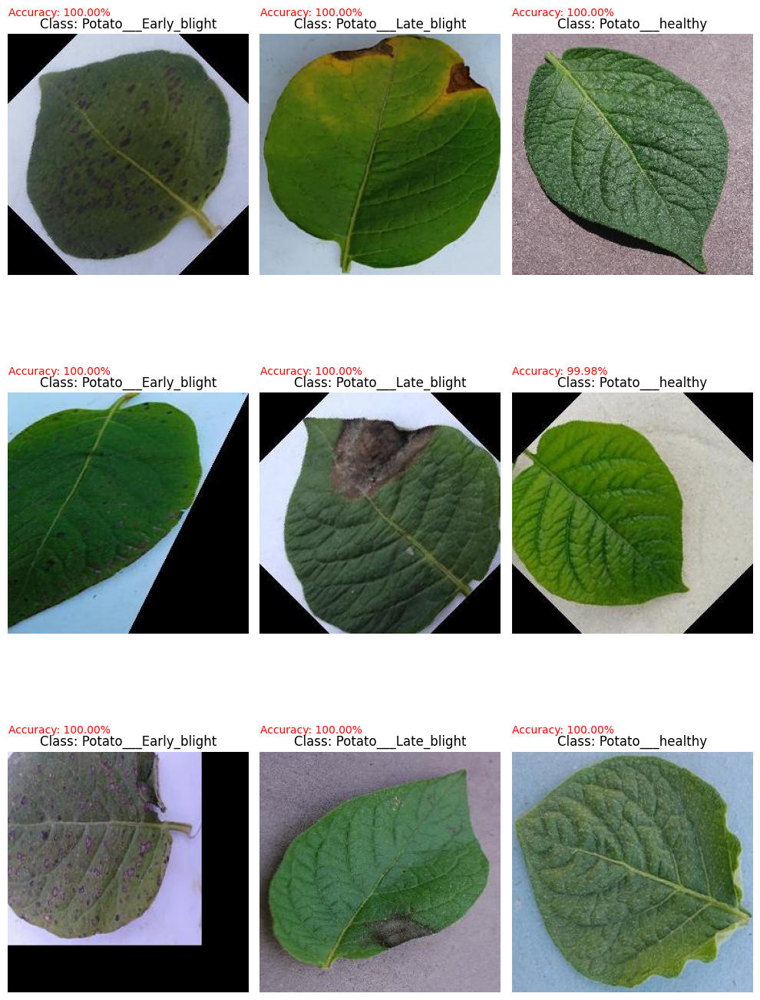

In [22]:
import random
import numpy as np
import matplotlib.pyplot as plt
import os
from tensorflow.keras.preprocessing.image import load_img, img_to_array

# Set the paths to the image folders
image_folder = 'D:/potatoo/images/Kriisan/test'
class_names = ['Potato___Early_blight', 'Potato___Late_blight', 'Potato___healthy']

# Set the number of images to choose per class
num_images_per_class = 3

# Initialize a list to store the randomly chosen images
chosen_images = []

# Randomly choose images from each class
for class_name in class_names:
    class_dir = os.path.join(image_folder, class_name)
    image_paths = os.listdir(class_dir)
    random.shuffle(image_paths)
    chosen_images.extend(image_paths[:num_images_per_class])

# Create a figure with 9 subplots
fig, axs = plt.subplots(num_images_per_class, len(class_names), figsize=(10, 15))

# Load and display the chosen images
for i, image_name in enumerate(chosen_images):
    class_index = i // num_images_per_class
    class_name = class_names[class_index]
    image_path = os.path.join(image_folder, class_name, image_name)
    image = load_img(image_path, target_size=(img_height, img_width))
    image_array = img_to_array(image) / 255.0

    row = i % num_images_per_class
    col = class_index
    ax = axs[row, col]
    ax.imshow(image_array)
    ax.axis('off')
    ax.set_title('Class: {}'.format(class_name))

    # Get the prediction for the image
    image_batch = np.expand_dims(image_array, axis=0)
    prediction = model.predict(image_batch)
    predicted_class = np.argmax(prediction)
    predicted_class_name = class_names[predicted_class]
    predicted_accuracy = prediction[0][predicted_class] * 100

    # Display the prediction accuracy
    ax.text(0, -20, 'Accuracy: {:.2f}%'.format(predicted_accuracy),
            color='red', fontsize=10)

# Adjust the spacing between subplots
plt.tight_layout()

# Display the plot
plt.show()


In [23]:
# Save the trained model
model.save('F:/ThesisMain/h5/thesisCnn30.h5')

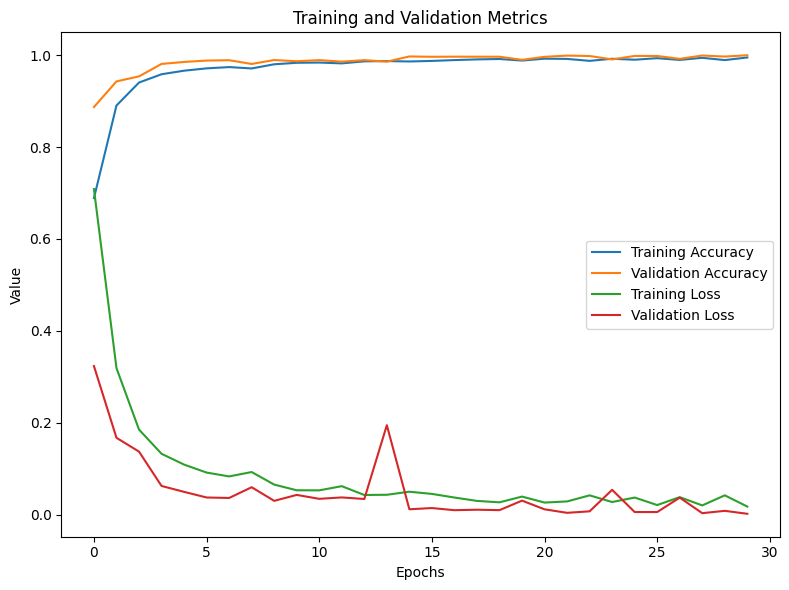

In [27]:
import matplotlib.pyplot as plt

# Plot the training and validation metrics
plt.figure(figsize=(8, 6))

# Plot training accuracy and validation accuracy
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')

# Plot training loss and validation loss
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')

plt.xlabel('Epochs')
plt.ylabel('Value')
plt.title('Training and Validation Metrics')
plt.legend()

plt.tight_layout()
plt.show()


In [25]:
import numpy as np
from sklearn.metrics import classification_report

# Get the model predictions on the validation set
validation_steps = len(validation_generator)
y_pred = model.predict(validation_generator, steps=validation_steps)
y_pred_classes = np.argmax(y_pred, axis=1)  # Convert predicted probabilities to class labels

# Get the true labels
y_true = validation_generator.classes

# Get the class labels
class_labels = list(validation_generator.class_indices.keys())

# Generate the classification report
report = classification_report(y_true, y_pred_classes, target_names=class_labels)

print(report)


818/818 [==============================] - 433s 529ms/step
                       precision    recall  f1-score   support

Potato___Early_Blight       0.30      0.30      0.30      7798
     Potato___Healthy       0.38      0.38      0.38      9822
 Potato___Late_Blight       0.33      0.33      0.33      8551

             accuracy                           0.34     26171
            macro avg       0.34      0.34      0.34     26171
         weighted avg       0.34      0.34      0.34     26171



In [26]:
# Load the trained model
model = tf.keras.models.load_model('F:/ThesisMain/h5/thesisCnn30.h5')

# Evaluate the model on the test dataset
loss, accuracy = model.evaluate(test_generator)

# Print the prediction accuracy
print("Prediction Accuracy: {:.2f}%".format(accuracy * 100))


26171/26171 [==============================] - 781s 30ms/step - loss: 0.0018 - accuracy: 0.9997
Prediction Accuracy: 99.97%


1/1 [==============================] - 0s 42ms/step


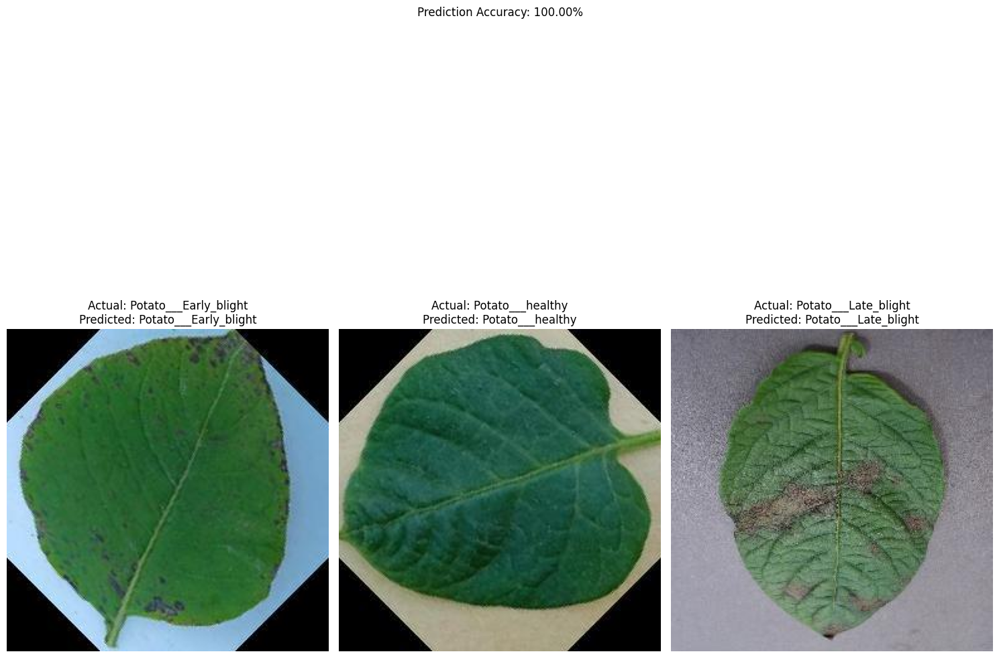

In [28]:
import os
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import load_img, img_to_array

# Set the paths to the image folders
test_dir = 'D:/potatoo/images/Kriisan/test'
class_names = ['Potato___Early_blight','Potato___healthy', 'Potato___Late_blight']
# Load the trained model
model = tf.keras.models.load_model('F:/ThesisMain/h5/thesisCnn30.h5')

# Randomly choose an image from each class for visualization
chosen_images = []
for class_name in class_names:
    class_dir = os.path.join(test_dir, class_name)
    image_paths = os.listdir(class_dir)
    chosen_image = np.random.choice(image_paths)
    chosen_images.append(chosen_image)

# Create subplots to display the chosen images and their predictions
fig, axs = plt.subplots(1, len(chosen_images), figsize=(15, 15))

# Load and predict the chosen images
# Load and predict the chosen images
accurate_predictions = 0  # Counter for accurate predictions
for i, image_name in enumerate(chosen_images):
    class_name = class_names[i]
    image_path = os.path.join(test_dir, class_name, image_name)
    image = load_img(image_path, target_size=(img_height, img_width))
    image_array = img_to_array(image) / 255.0
    image_array = np.expand_dims(image_array, axis=0)

    # Make a prediction
    prediction = model.predict(image_array)
    predicted_class_index = np.argmax(prediction)
    predicted_class_name = class_names[predicted_class_index]

    # Check if the prediction is accurate
    if predicted_class_name == class_name:
        accurate_predictions += 1

    # Display the image and its predicted class
    ax = axs[i]
    ax.imshow(image)
    ax.axis('off')
    ax.set_title(f'Actual: {class_name}\nPredicted: {predicted_class_name}')

# Calculate the prediction accuracy
accuracy = accurate_predictions / len(chosen_images) * 100

# Adjust the spacing between subplots
plt.tight_layout()

# Show the plot and prediction accuracy
plt.suptitle(f'Prediction Accuracy: {accuracy:.2f}%')
plt.show()



In [ ]:
#USE it RUN it....................................................................................................

In [29]:
import tkinter as tk
from tkinter import filedialog
from PIL import Image, ImageTk
import numpy as np
import tensorflow as tf

# Set the paths to your image folders
#train_dir = 'D:/potatoo/images/Kriisan/train'
#validation_dir = 'D:/potatoo/images/Kriisan/validation'
#test_dir = 'D:/potatoo/images/Kriisan/test'

# Set the parameters for the data generators
batch_size = 32
img_height, img_width = 256, 256

# Define the class names
class_names = ['Potato___Early_blight', 'Potato___healthy', 'Potato___Late_blight']#Potato___Late_blight

# Load the trained model
model = tf.keras.models.load_model('F:/ThesisMain/h5/thesisCnn30.h5')
#D:/potatoo/images/Kriisan/hiShuvolast.h5 
# Create the Tkinter GUI
root = tk.Tk()
root.title("Potato leaf Disease Classification")
root.geometry("600x400")
root.configure(bg="yellow")  # Set the window background color

# Function to classify the selected image
def classify_image():
    file_path = filedialog.askopenfilename()
    
    if file_path:
        # Load and preprocess the image
        image = Image.open(file_path)
        image = image.resize((img_width, img_height))
        image = image.convert("RGB")
        image_array = np.array(image) / 255.0
        image_array = np.expand_dims(image_array, axis=0)

        # Make a prediction
        prediction = model.predict(image_array)
        predicted_class_index = np.argmax(prediction)
        predicted_class = class_names[predicted_class_index]
        accuracy = prediction[0][predicted_class_index]

        # Display the image and prediction
        image = ImageTk.PhotoImage(image)  # Convert PIL image to Tkinter PhotoImage
        image_label.configure(image=image)
        image_label.image = image  # Store a reference to the image to prevent garbage collection

        result_label.config(text=f"Predicted class: {predicted_class}\nAccuracy: {accuracy:.2%}")
    else:
        result_label.config(text="No image selected.")

# Create GUI components
select_button = tk.Button(root, text="Select Image", command=classify_image, bg="hotpink", fg="white")  # Set the button color
select_button.pack(pady=10)

image_label = tk.Label(root)
image_label.pack(pady=10)

result_label = tk.Label(root, font=("Arial", 12))
result_label.pack(pady=10)

# Run the Tkinter event loop
root.mainloop()


1/1 [==============================] - 0s 31ms/step


In [ ]:
#image link

In [15]:
https://www.google.com/url?sa=i&url=https%3A%2F%2Fwww.wur.nl%2Fnl%2Fonderzoek-resultaten%2Fonderzoeksprojecten-lnv%2Fsoorten-onderzoek%2Fkennisonline%2Fdurable-resistance-to-early-blight-disease-in-potato.htm&psig=AOvVaw2pUtVgzYXCaCowt1MQKrVu&ust=1690122759885000&source=images&cd=vfe&opi=89978449&ved=0CA0QjRxqFwoTCIj4wYjEooADFQAAAAAdAAAAABBQ
    
    https://www.google.com/url?sa=i&url=https%3A%2F%2Fcontent.ces.ncsu.edu%2Fpotato-late-blight&psig=AOvVaw2pUtVgzYXCaCowt1MQKrVu&ust=1690122759885000&source=images&cd=vfe&opi=89978449&ved=0CA0QjRxqFwoTCIj4wYjEooADFQAAAAAdAAAAABBg
        
        https://www.google.com/url?sa=i&url=https%3A%2F%2Fwww.growveg.com.au%2Fguides%2Fhow-to-avoid-potato-blight%2F&psig=AOvVaw2pUtVgzYXCaCowt1MQKrVu&ust=1690122759885000&source=images&cd=vfe&opi=89978449&ved=0CA0QjRxqFwoTCIj4wYjEooADFQAAAAAdAAAAABBv
            
            https://www.google.com/url?sa=i&url=https%3A%2F%2Fwww.growerexperts.com%2Fcan-i-eat-potato-leaves%2F&psig=AOvVaw1nSkoblhatZuEwPQLEeBfk&ust=1690125227400000&source=images&cd=vfe&opi=89978449&ved=0CA0QjRxqFwoTCNiL-KDNooADFQAAAAAdAAAAABAD
                
                https://www.google.com/url?sa=i&url=https%3A%2F%2Fwww.garden.eco%2Fcan-you-eat-potato-leaves&psig=AOvVaw1nSkoblhatZuEwPQLEeBfk&ust=1690125227400000&source=images&cd=vfe&opi=89978449&ved=0CA0QjRxqFwoTCNiL-KDNooADFQAAAAAdAAAAABAQ
                    https://www.google.com/url?sa=i&url=https%3A%2F%2Fstock.adobe.com%2Fes%2Fimages%2Fleaves-of-green-new-potatoes-in-the-garden%2F438409124&psig=AOvVaw1nSkoblhatZuEwPQLEeBfk&ust=1690125227400000&source=images&cd=vfe&opi=89978449&ved=0CA0QjRxqFwoTCNiL-KDNooADFQAAAAAdAAAAABAo
            https://www.google.com/url?sa=i&url=https%3A%2F%2Fstock.adobe.com%2Fsearch%2Fimages%3Fk%3D%2522potato%2Bleaf%2522&psig=AOvVaw1nSkoblhatZuEwPQLEeBfk&ust=1690125227400000&source=images&cd=vfe&opi=89978449&ved=0CA0QjRxqFwoTCNiL-KDNooADFQAAAAAdAAAAABA4
                

SyntaxError: invalid decimal literal (2772577713.py, line 1)

In [31]:
import IPython

kernel_name = IPython.get_ipython().kernel.kernel_info['implementation']
print(f"Current Jupyter Notebook kernel: {kernel_name}")


Current Jupyter Notebook kernel: ipython


In [32]:
import tensorflow as tf
import numpy as np
import matplotlib

print("TensorFlow version:", tf.__version__)
print("NumPy version:", np.__version__)
print("Matplotlib version:", matplotlib.__version__)


TensorFlow version: 2.11.0
NumPy version: 1.22.3
Matplotlib version: 3.5.1


In [33]:
import IPython

kernel_version = IPython.sys.version
print("IPython kernel version:", kernel_version)


IPython kernel version: 3.10.2 (tags/v3.10.2:a58ebcc, Jan 17 2022, 14:12:15) [MSC v.1929 64 bit (AMD64)]


In [36]:
from PIL import Image

# Replace 'your_image_path' with the actual path to your image file
image_path = 'D:/potatoo/images/Kriisan/test/Potato___Early_blight/a.jpg'

# Open the image using PIL
image = Image.open(image_path)

# Get the dimensions (width and height) of the image
width, height = image.size

# Get the color mode of the image
color_mode = image.mode

print(f"Image dimensions: {width} x {height}")
print(f"Color mode: {color_mode}")


Image dimensions: 256 x 256
Color mode: RGB


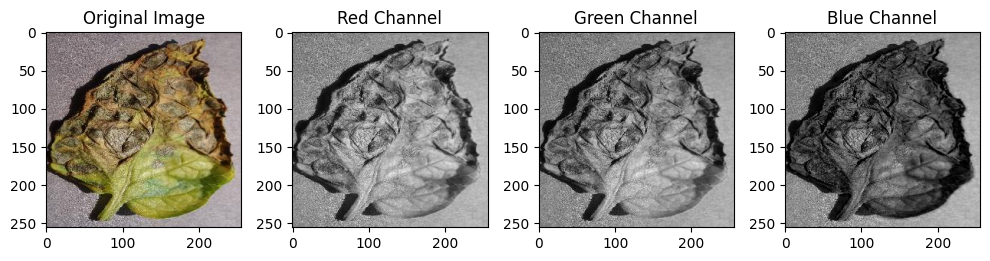

In [37]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

# Replace 'your_image_path' with the actual path to your image file
image_path = 'D:/potatoo/images/Kriisan/test/Potato___Early_blight/a.jpg'

# Open the image using PIL
image = Image.open(image_path)

# Convert the PIL image to a NumPy array
image_array = np.array(image)

# Split the image array into its color channels
red_channel = image_array[:, :, 0]
green_channel = image_array[:, :, 1]
blue_channel = image_array[:, :, 2]

# Display the original image and its individual color channels
plt.figure(figsize=(10, 5))
plt.subplot(1, 4, 1)
plt.imshow(image)
plt.title('Original Image')

plt.subplot(1, 4, 2)
plt.imshow(red_channel, cmap='gray')
plt.title('Red Channel')

plt.subplot(1, 4, 3)
plt.imshow(green_channel, cmap='gray')
plt.title('Green Channel')

plt.subplot(1, 4, 4)
plt.imshow(blue_channel, cmap='gray')
plt.title('Blue Channel')

plt.tight_layout()
plt.show()


In [38]:
from PIL import Image

# Replace 'your_image_path' with the actual path to your image file
image_path = 'D:/potatoo/images/Kriisan/test/Potato___Early_blight/a.jpg'

# Open the image using PIL
image = Image.open(image_path)

# Get the color mode of the image
color_mode = image.mode

if color_mode == 'L':
    channels = 1  # Grayscale image
elif color_mode == 'RGB':
    channels = 3  # RGB color image
elif color_mode == 'RGBA':
    channels = 4  # RGB image with alpha (transparency) channel
else:
    channels = -1  # Unknown color mode

print(f"Number of color channels in the image: {channels}")


Number of color channels in the image: 3


In [ ]:
If the code outputs "Number of color channels in the image: 3", it means that the image has 3 color channels. This corresponds to the typical color representation used in most images, known as the RGB (Red, Green, Blue) color model.

In an RGB image:

The red channel contains the intensity of red color.
The green channel contains the intensity of green color.
The blue channel contains the intensity of blue color.
These three color channels combine to create the full-color image that we perceive. Each pixel in the image is represented by a combination of these three color values.

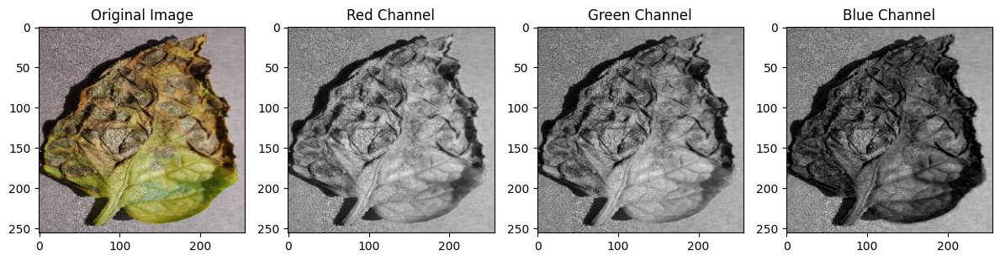

In [40]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

# Replace 'your_image_path' with the actual path to your RGB image file
image_path = 'D:/potatoo/images/Kriisan/test/Potato___Early_blight/a.jpg'

# Open the image using PIL
image = Image.open(image_path)

# Convert the PIL image to a NumPy array
image_array = np.array(image)

# Split the image array into its color channels
red_channel = image_array[:, :, 0]
green_channel = image_array[:, :, 1]
blue_channel = image_array[:, :, 2]

# Display the original image and its individual color channels
plt.figure(figsize=(12, 4))

plt.subplot(1, 4, 1)
plt.imshow(image)
plt.title('Original Image')

plt.subplot(1, 4, 2)
plt.imshow(red_channel, cmap='gray')
plt.title('Red Channel')

plt.subplot(1, 4, 3)
plt.imshow(green_channel, cmap='gray')
plt.title('Green Channel')

plt.subplot(1, 4, 4)
plt.imshow(blue_channel, cmap='gray')
plt.title('Blue Channel')

plt.tight_layout()
plt.show()


Number of color channels in the image: 3


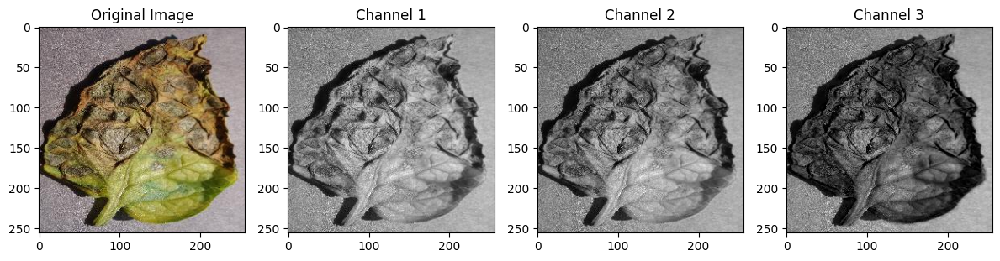

In [41]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

# Replace 'your_image_path' with the actual path to your image file
image_path = 'D:/potatoo/images/Kriisan/test/Potato___Early_blight/a.jpg'

# Open the image using PIL
image = Image.open(image_path)

# Get the color mode of the image
color_mode = image.mode

if color_mode == 'L':
    channels = 1  # Grayscale image
elif color_mode == 'RGB':
    channels = 3  # RGB color image
elif color_mode == 'RGBA':
    channels = 4  # RGB image with alpha (transparency) channel
else:
    channels = -1  # Unknown color mode

print(f"Number of color channels in the image: {channels}")

# Convert the PIL image to a NumPy array
image_array = np.array(image)

# Display the original image and its individual color channels
plt.figure(figsize=(12, 4))

plt.subplot(1, channels + 1, 1)
plt.imshow(image)
plt.title('Original Image')

for channel in range(channels):
    plt.subplot(1, channels + 1, channel + 2)
    plt.imshow(image_array[:, :, channel], cmap='gray')
    plt.title(f'Channel {channel + 1}')

plt.tight_layout()
plt.show()


Image Details:
Image path: D:/potatoo/images/Kriisan/test/Potato___Early_blight/a.jpg
Image dimensions: 256 x 256
Color mode: RGB
Number of color channels: 3


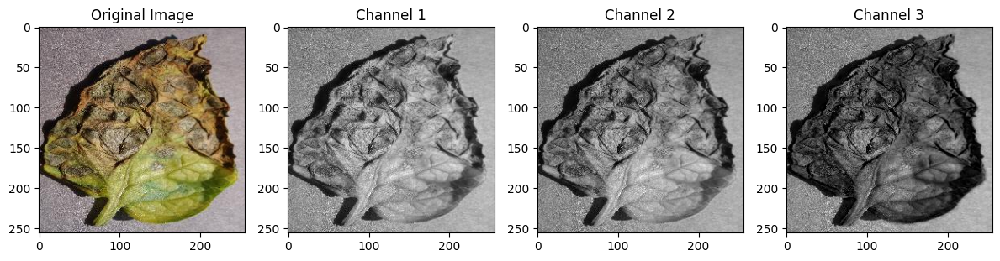

In [42]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

# Image path
image_path = 'D:/potatoo/images/Kriisan/test/Potato___Early_blight/a.jpg'

# Open the image using PIL
image = Image.open(image_path)

# Get image dimensions
width, height = image.size

# Get the color mode of the image
color_mode = image.mode

# Get the number of color channels
if color_mode == 'L':
    channels = 1  # Grayscale image
elif color_mode == 'RGB':
    channels = 3  # RGB color image
elif color_mode == 'RGBA':
    channels = 4  # RGB image with alpha (transparency) channel
else:
    channels = -1  # Unknown color mode

# Convert the PIL image to a NumPy array
image_array = np.array(image)

# Display image details
print("Image Details:")
print(f"Image path: {image_path}")
print(f"Image dimensions: {width} x {height}")
print(f"Color mode: {color_mode}")
print(f"Number of color channels: {channels}")

# Display the original image and its individual color channels
plt.figure(figsize=(12, 4))

plt.subplot(1, channels + 1, 1)
plt.imshow(image)
plt.title('Original Image')

for channel in range(channels):
    plt.subplot(1, channels + 1, channel + 2)
    plt.imshow(image_array[:, :, channel], cmap='gray')
    plt.title(f'Channel {channel + 1}')

plt.tight_layout()
plt.show()


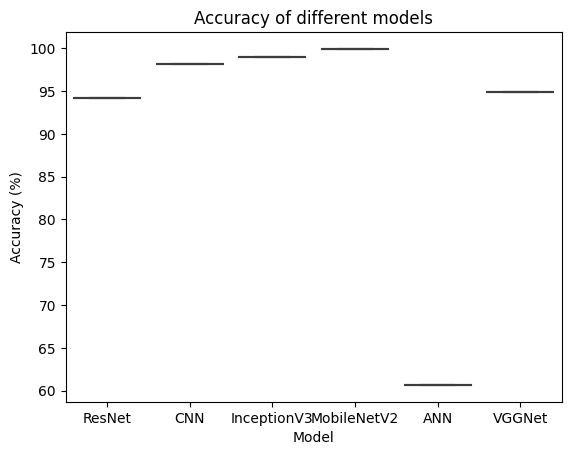

In [3]:
# Import libraries
import seaborn as sns
import matplotlib.pyplot as plt
# Import pandas
import pandas as pd
# Define the accuracy data
accuracy = [94.15, 98.15, 98.92, 99.92, 60.67, 94.89]
models = ["ResNet", "CNN", "InceptionV3", "MobileNetV2", "ANN", "VGGNet"]

# Create a dataframe with the data
df = pd.DataFrame({"accuracy": accuracy, "model": models})

# Create a figure and an axis
fig, ax = plt.subplots()

# Plot the box plot using seaborn
sns.boxplot(x="model", y="accuracy", data=df, ax=ax)

# Set the title and the labels
ax.set_title("Accuracy of different models")
ax.set_ylabel("Accuracy (%)")
ax.set_xlabel("Model")

# Show the plot
plt.show()


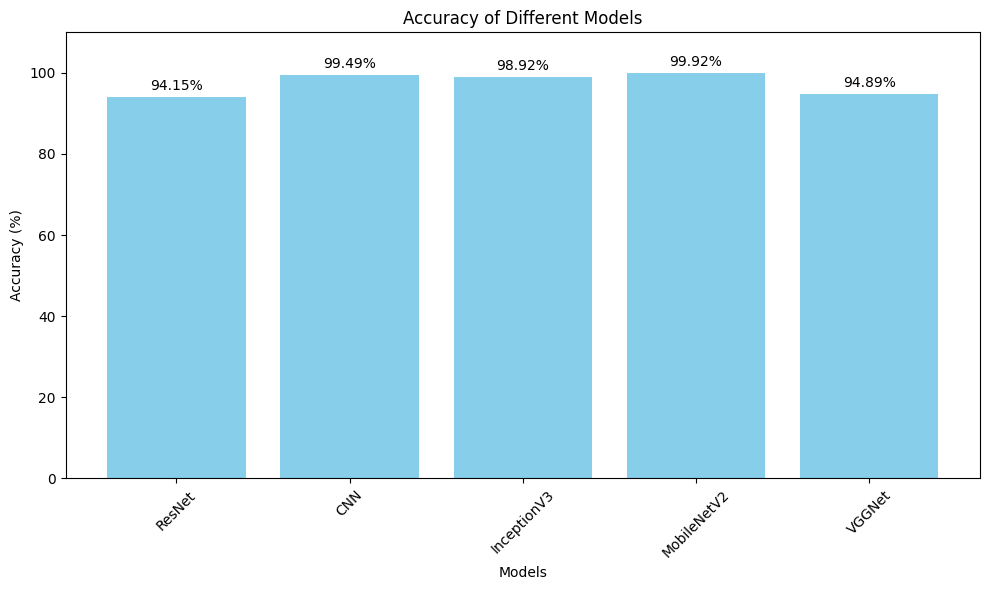

In [2]:
import matplotlib.pyplot as plt

accuracy = [ 60.67, 99.49, 98.92, 99.92,  94.89]
models = ["ANN", "CNN", "InceptionV3", "MobileNetV2", "VGGNet"]

# Create a bar graph
plt.figure(figsize=(10, 6))
plt.bar(models, accuracy, color='skyblue')
plt.xlabel('Models')
plt.ylabel('Accuracy (%)')
plt.title('Accuracy of Different Models')
plt.ylim(0, 110)  # Set the y-axis limit to 0-110 for better visualization
plt.xticks(rotation=45)  # Rotate the x-axis labels for readability

# Display the accuracy values on top of the bars
for i, acc in enumerate(accuracy):
    plt.text(i, acc + 1, f"{acc:.2f}%", ha='center', va='bottom')

plt.tight_layout()
plt.show()


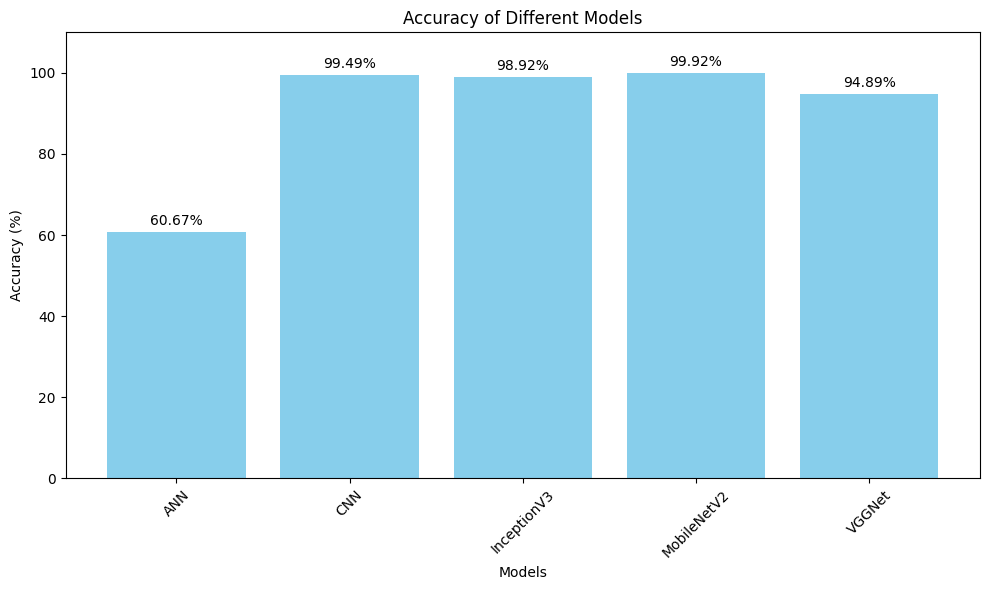

In [1]:
import matplotlib.pyplot as plt

accuracy = [ 60.67, 99.49, 98.92, 99.92,  94.89]
models = ["ANN", "CNN", "InceptionV3", "MobileNetV2", "VGGNet"]

# Create a bar graph
plt.figure(figsize=(10, 6))
plt.bar(models, accuracy, color='skyblue')
plt.xlabel('Models')
plt.ylabel('Accuracy (%)')
plt.title('Accuracy of Different Models')
plt.ylim(0, 110)  # Set the y-axis limit to 0-110 for better visualization
plt.xticks(rotation=45)  # Rotate the x-axis labels for readability

# Display the accuracy values on top of the bars
for i, acc in enumerate(accuracy):
    plt.text(i, acc + 1, f"{acc:.2f}%", ha='center', va='bottom')

plt.tight_layout()
plt.show()


In [2]:
import numpy as np
from sklearn.metrics import classification_report
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Set the path to your test image folder
test_dir = 'D:/potatoo/images/Kriisan/test'

# Set the parameters for the data generator
batch_size = 32
img_height, img_width = 256, 256

# Load the pre-trained model from the .h5 file
model = load_model('G:/Thesis/thesis_code_all/CNN/thesisCnn30.h5')

# Create a data generator for the test set
test_datagen = ImageDataGenerator(rescale=1.0/255.0)
test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical',  # Assuming it's a multi-class classification task
    shuffle=False  # Set to False to maintain order for evaluation
)

# Evaluate the model on the test data
test_loss, test_accuracy = model.evaluate(test_generator)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

# Generate predictions on the test data
predictions = model.predict(test_generator)
predicted_labels = np.argmax(predictions, axis=1)
true_labels = test_generator.classes

# Display the classification report
print("Classification Report:")
print(classification_report(true_labels, predicted_labels))


Found 26171 images belonging to 3 classes.
818/818 [==============================] - 500s 611ms/step - loss: 0.0018 - accuracy: 0.9997
Test Loss: 0.0017609825590625405
Test Accuracy: 0.9996943473815918
818/818 [==============================] - 487s 596ms/step
Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      7798
           1       1.00      1.00      1.00      9822
           2       1.00      1.00      1.00      8551

    accuracy                           1.00     26171
   macro avg       1.00      1.00      1.00     26171
weighted avg       1.00      1.00      1.00     26171



In [3]:
import numpy as np
from sklearn.metrics import classification_report
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Set the path to your test image folder
test_dir = 'D:/potatoo/images/Kriisan/test'

# Set the parameters for the data generator
batch_size = 32
img_height, img_width = 256, 256

# Load the pre-trained model from the .h5 file
model = load_model('G:/Thesis/thesis_code_all/CNN/thesisCnn30.h5')

# Create a data generator for the test set
test_datagen = ImageDataGenerator(rescale=1.0/255.0)
test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical',  # Assuming it's a multi-class classification task
    shuffle=False  # Set to False to maintain order for evaluation
)

# Evaluate the model on the test data
test_loss, test_accuracy = model.evaluate(test_generator)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

# Generate predictions on the test data
predictions = model.predict(test_generator)
predicted_labels = np.argmax(predictions, axis=1)
true_labels = test_generator.classes

# Get class names from the generator
class_names = list(test_generator.class_indices.keys())

# Display the classification report with class names
print("Classification Report:")
print(classification_report(true_labels, predicted_labels, target_names=class_names))


Found 26171 images belonging to 3 classes.
818/818 [==============================] - 463s 566ms/step - loss: 0.0018 - accuracy: 0.9997
Test Loss: 0.0017609825590625405
Test Accuracy: 0.9996943473815918
818/818 [==============================] - 478s 584ms/step
Classification Report:
                       precision    recall  f1-score   support

Potato___Early_Blight       1.00      1.00      1.00      7798
     Potato___Healthy       1.00      1.00      1.00      9822
 Potato___Late_Blight       1.00      1.00      1.00      8551

             accuracy                           1.00     26171
            macro avg       1.00      1.00      1.00     26171
         weighted avg       1.00      1.00      1.00     26171



In [4]:
import numpy as np
from sklearn.metrics import classification_report
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
thesisMobielNet.h5
# Set the path to your test image folder
test_dir = 'D:/potatoo/images/Kriisan/test'

# Set the parameters for the data generator
batch_size = 32
img_height, img_width = 256, 256

# Load the pre-trained model from the .h5 file
model = load_model('G:/Thesis/thesis_code_all/ann/thesisAnn.h5')
#G:\Thesis\thesis_code_all\ann
# Create a data generator for the test set
test_datagen = ImageDataGenerator(rescale=1.0/255.0)
test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical',  # Assuming it's a multi-class classification task
    shuffle=False  # Set to False to maintain order for evaluation
)

# Evaluate the model on the test data
test_loss, test_accuracy = model.evaluate(test_generator)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

# Generate predictions on the test data
predictions = model.predict(test_generator)
predicted_labels = np.argmax(predictions, axis=1)
true_labels = test_generator.classes

# Get class names from the generator
class_names = list(test_generator.class_indices.keys())

# Display the classification report with class names
print("Classification Report:")
print(classification_report(true_labels, predicted_labels, target_names=class_names))


Found 26171 images belonging to 3 classes.
818/818 [==============================] - 63s 77ms/step - loss: 0.7705 - accuracy: 0.6312
Test Loss: 0.7704852223396301
Test Accuracy: 0.6311566233634949
818/818 [==============================] - 62s 76ms/step
Classification Report:
                       precision    recall  f1-score   support

Potato___Early_Blight       0.57      0.80      0.67      7798
     Potato___Healthy       0.92      0.58      0.71      9822
 Potato___Late_Blight       0.50      0.53      0.52      8551

             accuracy                           0.63     26171
            macro avg       0.67      0.64      0.63     26171
         weighted avg       0.68      0.63      0.64     26171



In [5]:
import numpy as np
from sklearn.metrics import classification_report
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Set the path to your test image folder
test_dir = 'D:/potatoo/images/Kriisan/test'

# Set the parameters for the data generator
batch_size = 32
img_height, img_width = 256, 256

# Load the pre-trained model from the .h5 file
model = load_model('G:/Thesis/thesis_code_all/ins/thesisIns30.h5')
#G:\Thesis\thesis_code_all\ann
# Create a data generator for the test set
test_datagen = ImageDataGenerator(rescale=1.0/255.0)
test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical',  # Assuming it's a multi-class classification task
    shuffle=False  # Set to False to maintain order for evaluation
)

# Evaluate the model on the test data
test_loss, test_accuracy = model.evaluate(test_generator)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

# Generate predictions on the test data
predictions = model.predict(test_generator)
predicted_labels = np.argmax(predictions, axis=1)
true_labels = test_generator.classes

# Get class names from the generator
class_names = list(test_generator.class_indices.keys())

# Display the classification report with class names
print("Classification Report:")
print(classification_report(true_labels, predicted_labels, target_names=class_names))


Found 26171 images belonging to 3 classes.
818/818 [==============================] - 2230s 3s/step - loss: 0.0590 - accuracy: 0.9754
Test Loss: 0.059046242386102676
Test Accuracy: 0.9754308462142944
818/818 [==============================] - 2443s 3s/step
Classification Report:
                       precision    recall  f1-score   support

Potato___Early_Blight       1.00      0.96      0.98      7798
     Potato___Healthy       1.00      0.97      0.98      9822
 Potato___Late_Blight       0.93      1.00      0.96      8551

             accuracy                           0.98     26171
            macro avg       0.98      0.98      0.98     26171
         weighted avg       0.98      0.98      0.98     26171

